<a href="https://colab.research.google.com/github/shadi97kh/ULTRA-AIR/blob/main/train_yolov9_object_detection_on_neck_ultrasound_fold.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Fri Jul 12 13:39:32 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Clone and Install

**NOTE:** YOLOv9 is very new. At the moment, we recommend using a fork of the main repository. The `detect.py` script contains a bug that prevents inference. This bug is patched in the fork.

In [ ]:
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (218/218), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 325 (delta 159), reused 156 (delta 156), pack-reused 107
Receiving objects: 100% (325/325), 2.23 MiB | 30.92 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 55.5 MB/s eta 0:00:00


**NOTE:** Let's install the [`roboflow`](https://pypi.org/project/roboflow) package, which we will use to download our dataset from [Roboflow Universe](https://universe.roboflow.com/).

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.2/800.2 kB 10.8 MB/s eta 0:00:00


## Import the required libraries

In [ ]:
import os
import pathlib
import shutil
import json
import yaml
import locale
from zipfile import ZipFile

import numpy as np
from matplotlib import pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import ultralytics
from ultralytics import YOLO

locale.getpreferredencoding = lambda: "UTF-8"

ultralytics.checks()
import ultralytics
from ultralytics import YOLO, RTDETR

Ultralytics YOLOv8.2.55 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 30.3/201.2 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Running the model with early stopping

In [ ]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_score = None
        self.counter = 0
        self.early_stop = False

    def __call__(self, score):
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

Processing fold with test subject: Sub011
Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub011, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, 

train: Scanning /content/drive/MyDrive/datasets/train/labels.cache... 2573 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2573/2573 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame002.png: 2 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame003.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame004.png: 6 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame005.png: 8 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame006.png: 10 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame007.png: 12 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame008.png: 14 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub012_1TCC1_F000006_frame009.png: 16 duplicate labels remo


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 724 images, 0 backgrounds, 0 corrupt: 100%|██████████| 724/724 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame002.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame006.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed
val: WARNING ⚠️ /content/drive/M

Plotting labels to results/v0.0.2.20_fold_Sub011/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub011
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.93G        3.1      2.792      3.687        112        320: 100%|██████████| 81/81 [00:44<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]


                   all        724       2332      0.759       0.25      0.156     0.0398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.84G      1.985      1.722        2.5         79        320: 100%|██████████| 81/81 [00:34<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.13it/s]


                   all        724       2332      0.796       0.37      0.434      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.81G       1.61      1.401      2.055         75        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.20it/s]


                   all        724       2332      0.438      0.664      0.605      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.92G      1.459      1.261      1.889         81        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]


                   all        724       2332       0.55      0.779      0.662       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.83G      1.378      1.172       1.79        112        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.17it/s]

                   all        724       2332      0.586      0.759      0.704      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       5.9G      1.321      1.101      1.725         81        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.713       0.81      0.822      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.83G      1.255      1.034      1.666        116        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.643      0.769      0.795      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.91G      1.229      1.004      1.635         75        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.22it/s]

                   all        724       2332      0.708      0.781      0.779      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.83G      1.205     0.9662      1.624         80        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.14it/s]

                   all        724       2332        0.7      0.846       0.82      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.92G      1.182     0.9402      1.598         87        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.22it/s]

                   all        724       2332       0.63      0.799      0.778      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.83G      1.152     0.8963      1.567         69        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.777      0.828      0.854      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.91G       1.14     0.8711      1.555         80        320: 100%|██████████| 81/81 [00:33<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.779      0.838      0.846      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.81G      1.115     0.8478      1.537         88        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.15it/s]

                   all        724       2332      0.703      0.842      0.808      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.92G      1.097     0.8245      1.519         84        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]

                   all        724       2332       0.82      0.798      0.825      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.81G      1.088     0.8134       1.51         82        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.765      0.761      0.808      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       5.9G      1.076     0.7848      1.501        105        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.19it/s]

                   all        724       2332       0.81      0.834      0.839      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.81G      1.062     0.7765      1.494         83        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.721      0.695      0.778      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       5.9G      1.048     0.7604       1.48         71        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.702      0.815      0.771       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.83G       1.02     0.7395      1.462         85        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.847      0.795      0.851      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.92G       1.02     0.7258      1.459         77        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.792      0.801      0.797      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.83G      1.003     0.7127      1.446         81        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.805      0.815      0.827      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       5.9G     0.9899     0.7033      1.437         68        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.823      0.897      0.865      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.83G     0.9825     0.6895      1.429         88        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.748      0.769      0.777      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.92G      0.982      0.686      1.418         81        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.737      0.861      0.818      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.83G     0.9652     0.6765      1.406         80        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.811      0.891      0.863      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       5.9G     0.9548     0.6692      1.411         87        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.777      0.776      0.795      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.81G     0.9414     0.6597      1.394         88        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.781      0.795      0.807      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.89G     0.9284     0.6381      1.379         92        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.15it/s]

                   all        724       2332      0.809      0.781       0.83       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.83G     0.9214     0.6368      1.378         87        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.825      0.838      0.846      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.92G     0.9156     0.6311      1.376         74        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.732      0.868      0.809       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.83G     0.9131     0.6272      1.377         82        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.20it/s]

                   all        724       2332      0.768      0.836      0.822      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.92G     0.8979     0.6144       1.36         64        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.815      0.855      0.848      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.83G     0.8922     0.6107      1.358         75        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.729      0.846      0.812      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       5.9G     0.8799      0.593      1.347         66        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]

                   all        724       2332      0.814       0.85      0.847      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.81G     0.8649     0.5822      1.335         70        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.759      0.811      0.792      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.91G     0.8651     0.5846      1.338         79        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.22it/s]

                   all        724       2332       0.79        0.8      0.789      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.82G     0.8644     0.5822      1.332         91        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.792      0.806      0.803      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       5.9G     0.8476     0.5732      1.321         80        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.22it/s]

                   all        724       2332      0.789      0.873      0.823      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.81G     0.8416     0.5558      1.311         79        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332      0.787      0.879       0.84      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       5.9G     0.8321     0.5563      1.303         96        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332       0.78      0.805      0.782      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.81G     0.8199     0.5504      1.289        101        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.24it/s]

                   all        724       2332      0.792      0.813      0.828      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.92G      0.808     0.5352      1.281        110        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]

                   all        724       2332      0.772      0.825      0.801      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.81G       0.81     0.5377      1.293         85        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.17it/s]

                   all        724       2332      0.765      0.842      0.806      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.92G     0.8012     0.5363      1.282         95        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.24it/s]

                   all        724       2332      0.794      0.807      0.808      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.83G     0.7821     0.5199      1.265         84        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.24it/s]

                   all        724       2332      0.773      0.832      0.807      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       5.9G     0.7867     0.5217      1.268         83        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.19it/s]

                   all        724       2332      0.775      0.846      0.814      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.81G     0.7827     0.5116      1.261         66        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.792      0.794      0.805      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       5.9G     0.7648      0.498      1.251         65        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]

                   all        724       2332      0.807      0.807      0.815      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.82G      0.762      0.504      1.248         93        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]

                   all        724       2332      0.804      0.863      0.832      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       5.9G     0.7675      0.499      1.253         81        320: 100%|██████████| 81/81 [00:33<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.20it/s]

                   all        724       2332       0.79      0.887      0.853      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.81G     0.7518     0.4914       1.24         99        320: 100%|██████████| 81/81 [00:33<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]

                   all        724       2332      0.803      0.802      0.821      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       5.9G     0.7434     0.4864      1.233        108        320: 100%|██████████| 81/81 [00:33<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.31it/s]

                   all        724       2332      0.779      0.842      0.827      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.83G     0.7412     0.4869      1.231         76        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.816      0.854      0.838      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100       5.9G       0.74      0.483      1.232         94        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]

                   all        724       2332       0.76      0.849      0.813      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.83G     0.7293     0.4745      1.224         89        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.30it/s]

                   all        724       2332      0.757      0.818      0.811      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.91G     0.7245     0.4677      1.216        110        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.795      0.862      0.853      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.83G     0.7149     0.4646      1.211         91        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]

                   all        724       2332      0.785      0.811      0.809      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.91G     0.7165     0.4644      1.214         95        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.727      0.888      0.822      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.82G     0.7156     0.4618      1.216         59        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.29it/s]

                   all        724       2332      0.764      0.832      0.822      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.92G     0.7008     0.4532      1.206         80        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.782      0.823       0.82       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.82G     0.6883     0.4475      1.191        107        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.19it/s]

                   all        724       2332       0.78       0.81      0.794      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.91G     0.6879     0.4462      1.197         90        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]

                   all        724       2332      0.764       0.87       0.84      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.83G     0.6806     0.4375      1.186        104        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.28it/s]

                   all        724       2332      0.811      0.817      0.823      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.92G     0.6782     0.4422      1.192         68        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.801      0.795      0.795       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.83G     0.6792     0.4422      1.187        124        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.17it/s]

                   all        724       2332      0.753      0.815      0.818      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.92G     0.6663     0.4317      1.168         68        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.23it/s]

                   all        724       2332      0.809      0.785      0.823      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.83G     0.6587     0.4314      1.167         95        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.27it/s]

                   all        724       2332      0.786      0.785      0.804      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.91G      0.652     0.4212      1.164         94        320: 100%|██████████| 81/81 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.22it/s]

                   all        724       2332      0.796      0.809      0.819      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.81G     0.6506      0.422      1.168         77        320: 100%|██████████| 81/81 [00:33<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.20it/s]

                   all        724       2332      0.781      0.828       0.81      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.91G     0.6473     0.4173       1.16         79        320: 100%|██████████| 81/81 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.29it/s]

                   all        724       2332      0.783      0.821      0.813      0.469
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 50, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



70 epochs completed in 0.793 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub011/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub011/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub011/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:08<00:00,  1.44it/s]


                   all        724       2332      0.789      0.887      0.852       0.48
     Thyroid-cartilage        140        140      0.912      0.957      0.966      0.542
          Strap-muscle        724       1448      0.913      0.888      0.951       0.51
         Tracheal-ring        296        296      0.504      0.701      0.584      0.318
         Thyroid-gland        448        448      0.829          1      0.908      0.551
Speed: 0.1ms preprocess, 3.6ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub011
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 724 images, 0 backgrounds, 0 corrupt: 100%|██████████| 724/724 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame002.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame006.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed
val: WARNING ⚠️ /content/drive/M


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:15<00:00,  1.52it/s]


                   all        724       2332       0.79      0.888      0.853       0.48
     Thyroid-cartilage        140        140      0.912      0.957      0.966      0.543
          Strap-muscle        724       1448      0.911      0.888      0.951       0.51
         Tracheal-ring        296        296      0.507      0.706      0.587      0.319
         Thyroid-gland        448        448      0.829          1      0.908      0.551
Speed: 0.1ms preprocess, 7.5ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub011/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub011_1TCC_F000047_frame019.png: 320x320 2 Strap-muscles, 21.6ms
Speed: 1.4ms preprocess, 21.6ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub011_1TCC_F000047_frame020.png: 320x320 1 Strap-muscle, 21.6ms
Speed: 1.1ms preprocess, 21.6ms inference, 1.4ms postprocess per image at shape (1, 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub012, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect

train: Scanning /content/drive/MyDrive/datasets/train/labels... 2691 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2691/2691 [00:33<00:00, 81.38it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame009.png: 9 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame010.png: 10 duplicate labels removed

train: New cache created: /content/drive/MyDrive/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels... 592 images, 0 backgrounds, 0 corrupt: 100%|██████████| 592/592 [00:05<00:00, 105.98it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame002.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame003.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame004.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame005.png: 8 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame006.png: 10 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame007.png: 12 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame008.png: 14 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame009.png: 16 duplicate labels removed
val: WARNING ⚠️ /content/dri

val: New cache created: /content/drive/MyDrive/datasets/val/labels.cache
Plotting labels to results/v0.0.2.20_fold_Sub012/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub012
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         6G      3.048       2.77      3.665         13        320: 100%|██████████| 85/85 [00:39<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        592       1670      0.755       0.25     0.0493     0.0128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       5.9G      1.948      1.718      2.469         17        320: 100%|██████████| 85/85 [00:36<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.32it/s]

                   all        592       1670      0.247      0.559      0.312      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.84G      1.606      1.361      2.031         29        320: 100%|██████████| 85/85 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]


                   all        592       1670      0.377      0.809      0.724      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.97G      1.486      1.236      1.883         16        320: 100%|██████████| 85/85 [00:35<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]


                   all        592       1670      0.577      0.618      0.612      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.86G      1.391      1.136      1.769         22        320: 100%|██████████| 85/85 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.31it/s]

                   all        592       1670      0.482      0.757      0.663      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.97G       1.33      1.083      1.708         27        320: 100%|██████████| 85/85 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.31it/s]

                   all        592       1670      0.627      0.759      0.772      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.86G      1.298       1.04      1.675         10        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670      0.586      0.829      0.732      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.96G      1.272      1.014      1.657         16        320: 100%|██████████| 85/85 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        592       1670      0.543      0.787      0.701      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.86G      1.227      0.971      1.614         19        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.598      0.639      0.723      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.97G      1.193      0.927      1.577         24        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670      0.784      0.812      0.836      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.84G      1.189     0.8978      1.566         32        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        592       1670      0.668      0.809       0.78      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.95G      1.152     0.8618       1.55         12        320: 100%|██████████| 85/85 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.776      0.869      0.888       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.86G      1.135     0.8459      1.524         22        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.693      0.814      0.823      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.97G      1.123     0.8405      1.521         24        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        592       1670      0.752      0.857      0.875      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.86G        1.1     0.7987      1.496         24        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.789      0.759        0.8       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.97G      1.093     0.7996      1.497         16        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        592       1670       0.73      0.817       0.79      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.86G      1.084      0.784      1.493         25        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.672      0.783      0.757      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.97G       1.07     0.7676      1.477         14        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.734      0.833       0.82      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.86G      1.054     0.7459      1.466         26        320: 100%|██████████| 85/85 [00:34<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        592       1670      0.676      0.813      0.815      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.97G      1.038     0.7335      1.452         25        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        592       1670      0.706      0.751      0.806      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.86G       1.03     0.7271      1.444         21        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.831      0.836      0.903      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.95G      1.024     0.7165      1.445         20        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.774      0.814      0.834      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.86G     0.9979     0.6988      1.422         10        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.838      0.751      0.833      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.97G     0.9994     0.6938      1.416         20        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        592       1670       0.72      0.877      0.825      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.85G     0.9857      0.681       1.41         26        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        592       1670      0.779      0.815      0.865        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.96G      0.977     0.6691      1.406         17        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        592       1670      0.866      0.776      0.902      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.86G     0.9568     0.6534      1.387         13        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        592       1670      0.786      0.806      0.861       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.97G     0.9584     0.6525      1.387         12        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        592       1670      0.746      0.757       0.82      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.84G     0.9505     0.6454      1.389         11        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        592       1670      0.774      0.825      0.877      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.95G     0.9265     0.6293      1.376         20        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        592       1670      0.719      0.775      0.801      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.86G       0.93     0.6309      1.369         30        320: 100%|██████████| 85/85 [00:34<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        592       1670      0.803       0.81      0.867      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.97G     0.9128     0.6159      1.357         21        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        592       1670      0.785      0.747      0.839      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.86G     0.9043     0.6015      1.351         14        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670      0.778      0.828      0.879      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.96G     0.9011     0.6003      1.347         18        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        592       1670      0.722      0.781      0.756      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.87G     0.9011      0.594      1.343         22        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.837      0.713      0.826        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.97G     0.8838     0.5858       1.33         33        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]

                   all        592       1670      0.727      0.758      0.816      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.86G     0.8688     0.5757      1.318         16        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670       0.84      0.734       0.86      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.97G     0.8615     0.5632      1.304         28        320: 100%|██████████| 85/85 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670      0.834      0.805      0.876      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.86G     0.8645     0.5718      1.313         24        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

                   all        592       1670      0.822      0.758      0.857      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.97G     0.8459     0.5545      1.304          9        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        592       1670      0.595      0.757      0.759      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.84G     0.8451      0.551      1.301         19        320: 100%|██████████| 85/85 [00:34<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        592       1670      0.696      0.738      0.749      0.479
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 21, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



41 epochs completed in 0.473 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub012/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub012/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub012/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]


                   all        592       1670       0.83      0.835      0.903      0.544
     Thyroid-cartilage         61         61      0.664      0.902      0.888      0.613
          Strap-muscle        562       1117      0.874      0.799      0.886      0.411
         Tracheal-ring        175        175      0.883       0.92      0.924      0.539
         Thyroid-gland        317        317      0.898      0.719      0.914      0.614
Speed: 0.0ms preprocess, 3.7ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub012
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 592 images, 0 backgrounds, 0 corrupt: 100%|██████████| 592/592 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame002.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame003.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame004.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame005.png: 8 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame006.png: 10 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame007.png: 12 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame008.png: 14 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub012_1TCC1_F000006_frame009.png: 16 duplicate labels removed
val: WARNING ⚠️ /content/dri


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:12<00:00,  1.58it/s]


                   all        592       1670      0.827      0.834      0.902      0.544
     Thyroid-cartilage         61         61      0.663      0.902      0.888      0.613
          Strap-muscle        562       1117      0.874      0.798      0.885       0.41
         Tracheal-ring        175        175      0.883       0.92      0.924      0.539
         Thyroid-gland        317        317       0.89      0.717      0.914      0.614
Speed: 0.1ms preprocess, 7.6ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub012/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub012_1TCC_F000001_frame000.png: 320x320 1 Thyroid-cartilage, 3 Strap-muscles, 21.6ms
Speed: 1.1ms preprocess, 21.6ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub012_1TCC_F000001_frame002.png: 320x320 1 Thyroid-cartilage, 3 Strap-muscles, 21.6ms
Speed: 1.4ms preprocess, 21.6ms inference

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub013, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect

train: Scanning /content/drive/MyDrive/datasets/train/labels... 2669 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2669/2669 [00:35<00:00, 74.21it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame009.png: 9 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame010.png: 10 duplicate labels removed

train: New cache created: /content/drive/MyDrive/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels... 617 images, 0 backgrounds, 0 corrupt: 100%|██████████| 617/617 [00:06<00:00, 102.75it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame004.png: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame005.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame006.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame059.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame064.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame089.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame096.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame097.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/M

val: New cache created: /content/drive/MyDrive/datasets/val/labels.cache
Plotting labels to results/v0.0.2.20_fold_Sub013/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub013
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.94G      3.072      2.811      3.678         95        320: 100%|██████████| 84/84 [00:38<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        617       1965      0.757      0.249      0.121     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         6G      1.986      1.785      2.492         92        320: 100%|██████████| 84/84 [00:35<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        617       1965      0.524        0.4      0.484      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.84G       1.64      1.443      2.068         72        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]

                   all        617       1965      0.467      0.851      0.697      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.84G      1.498      1.327      1.921         88        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]

                   all        617       1965      0.338      0.648      0.496      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.84G      1.418       1.22      1.815        115        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        617       1965      0.678      0.607      0.613      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.84G      1.358      1.138      1.752         88        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]

                   all        617       1965      0.712      0.787       0.77      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.84G      1.312      1.083      1.703         64        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        617       1965      0.661      0.672      0.701      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.82G      1.263      1.044      1.666         82        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]

                   all        617       1965      0.531      0.695      0.633       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.84G      1.244      1.022      1.645         79        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        617       1965      0.585      0.681      0.649      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.84G      1.227     0.9739      1.626         87        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        617       1965      0.606      0.676      0.673      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.84G      1.189      0.949      1.583        108        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]

                   all        617       1965      0.602      0.645      0.632      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.83G      1.162     0.9165      1.566         75        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]

                   all        617       1965      0.563      0.692      0.698      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.83G      1.147     0.8801      1.546        105        320: 100%|██████████| 84/84 [00:35<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        617       1965      0.605      0.702      0.664      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.83G      1.122     0.8596      1.535         85        320: 100%|██████████| 84/84 [00:34<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        617       1965      0.649      0.852       0.78      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.84G       1.11      0.828       1.52         90        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        617       1965      0.596      0.722      0.683      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.82G      1.095     0.8336      1.515         58        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        617       1965      0.649      0.745      0.712      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.83G      1.089      0.806      1.507         65        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        617       1965      0.594      0.744      0.667      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.84G      1.081      0.792      1.495         77        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        617       1965      0.702      0.719      0.701      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.84G      1.057     0.7812      1.484         73        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        617       1965      0.636      0.784      0.748      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.84G      1.034     0.7452      1.461         94        320: 100%|██████████| 84/84 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        617       1965      0.683      0.702      0.709      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.82G      1.032     0.7313      1.459         83        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]

                   all        617       1965      0.561      0.665       0.63      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.83G      1.024     0.7359      1.453         69        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]

                   all        617       1965      0.633       0.73      0.704       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.82G      1.005     0.7179      1.432         94        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        617       1965      0.596      0.717      0.719      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.84G     0.9869     0.6919      1.418         86        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]

                   all        617       1965      0.639      0.675      0.715      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.84G      0.978     0.6862      1.421         84        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        617       1965      0.695      0.778      0.772      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.84G     0.9595     0.6747      1.401         59        320: 100%|██████████| 84/84 [00:34<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        617       1965      0.671      0.741       0.72      0.366
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 6, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



26 epochs completed in 0.300 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub013/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub013/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub013/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]


                   all        617       1965      0.712      0.787       0.77      0.441
     Thyroid-cartilage         51         51      0.864      0.745      0.868      0.464
          Strap-muscle        617       1234      0.943      0.897      0.944       0.48
         Tracheal-ring        180        180      0.225      0.593      0.324      0.166
         Thyroid-gland        499        500      0.818      0.914      0.944      0.654
Speed: 0.0ms preprocess, 3.7ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub013
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 617 images, 0 backgrounds, 0 corrupt: 100%|██████████| 617/617 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame004.png: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame005.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame006.png: 6 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame059.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame064.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame089.png: 3 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame096.png: 2 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/datasets/val/images/Sub013_1TCC1_F000051_frame097.png: 4 duplicate labels removed
val: WARNING ⚠️ /content/drive/M


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


                   all        617       1965      0.713      0.786       0.77      0.441
     Thyroid-cartilage         51         51      0.865      0.745      0.865      0.463
          Strap-muscle        617       1234      0.944      0.897      0.944      0.481
         Tracheal-ring        180        180      0.224      0.589      0.327      0.168
         Thyroid-gland        499        500       0.82      0.914      0.944      0.654
Speed: 0.1ms preprocess, 7.8ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub013/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub013_1TCC_F000047_frame078.png: 320x320 3 Strap-muscles, 1 Thyroid-gland, 21.6ms
Speed: 1.2ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub013_1TCC_F000046_frame030.png: 320x320 1 Thyroid-cartilage, 1 Strap-muscle, 22.0ms
Speed: 1.6ms preprocess, 22.0ms inference, 1.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub015, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect

train: Scanning /content/drive/MyDrive/datasets/train/labels... 2753 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2753/2753 [00:33<00:00, 81.42it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame002.png: 2 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame006.png: 6 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed


train: New cache created: /content/drive/MyDrive/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels... 524 images, 0 backgrounds, 0 corrupt: 100%|██████████| 524/524 [00:05<00:00, 103.06it/s]


val: New cache created: /content/drive/MyDrive/datasets/val/labels.cache
Plotting labels to results/v0.0.2.20_fold_Sub015/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub015
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.97G      3.084      2.763       3.68          4        320: 100%|██████████| 87/87 [00:39<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.22it/s]

                   all        524       1746    0.00963       0.51     0.0202     0.0061



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.01G      2.022      1.741      2.517          6        320: 100%|██████████| 87/87 [00:36<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]

                   all        524       1746      0.881      0.446      0.577      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.96G      1.666      1.401      2.092          6        320: 100%|██████████| 87/87 [00:35<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        524       1746      0.558      0.838      0.854      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.83G      1.555      1.294      1.952          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        524       1746      0.826      0.658      0.791      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.96G      1.436      1.164      1.812          9        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]

                   all        524       1746       0.67      0.838      0.836      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.83G      1.369      1.073      1.751          6        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        524       1746      0.711      0.801      0.796      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.94G       1.34      1.038      1.724          2        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.22it/s]

                   all        524       1746      0.725      0.713      0.739      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.83G      1.287     0.9966      1.679          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]

                   all        524       1746      0.726      0.823      0.804      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.94G      1.265     0.9538      1.656          8        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.731      0.891      0.858      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.83G      1.237      0.909      1.628         10        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        524       1746      0.763      0.881      0.891      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.96G      1.212     0.8828      1.608          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.22it/s]

                   all        524       1746      0.798      0.893      0.893      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.83G      1.197     0.8761      1.599          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.22it/s]

                   all        524       1746       0.77      0.901      0.883      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.95G      1.165      0.819      1.557          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        524       1746       0.76      0.866      0.835      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.83G      1.142     0.8072      1.536         11        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]

                   all        524       1746      0.775      0.818      0.826      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.93G      1.138     0.8019      1.538          6        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.774      0.886      0.862      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.85G      1.126      0.768      1.527          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.25it/s]

                   all        524       1746      0.792      0.907      0.916      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.96G      1.135     0.8055      1.529          2        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.25it/s]

                   all        524       1746      0.793      0.872      0.889      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.85G      1.091     0.7585      1.501          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]

                   all        524       1746      0.766      0.845      0.817      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.93G      1.073     0.7351      1.487          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]

                   all        524       1746      0.813      0.893      0.861      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.85G      1.064     0.7157      1.485          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]

                   all        524       1746      0.843      0.869      0.859      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.94G      1.053     0.7019      1.468         10        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]

                   all        524       1746      0.752      0.853      0.802      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.83G      1.049     0.6907      1.455          7        320: 100%|██████████| 87/87 [00:35<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.27it/s]

                   all        524       1746      0.756      0.859      0.826      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.94G      1.021     0.6835       1.43          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.30it/s]

                   all        524       1746      0.779      0.908      0.865      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.85G      1.002     0.6688      1.437          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.34it/s]

                   all        524       1746      0.802      0.858      0.865      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.96G      1.009     0.6893       1.44          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        524       1746      0.787      0.909       0.88      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.83G     0.9797     0.6489      1.404          6        320: 100%|██████████| 87/87 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.35it/s]

                   all        524       1746        0.8      0.836      0.845      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.95G     0.9798     0.6432      1.405          6        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.34it/s]

                   all        524       1746      0.811      0.911      0.899      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.85G     0.9705     0.6356      1.406          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.30it/s]

                   all        524       1746      0.812      0.914      0.908      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.94G     0.9671     0.6365      1.409          2        320: 100%|██████████| 87/87 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]

                   all        524       1746      0.758      0.912      0.827      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.85G     0.9585     0.6201      1.393          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746      0.853      0.875      0.883      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.96G     0.9404     0.6102      1.381          5        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        524       1746      0.762      0.808      0.797      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.85G     0.9286     0.6093      1.372          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746      0.756      0.883      0.817      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.94G     0.9348     0.6139       1.38          3        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.30it/s]

                   all        524       1746      0.784       0.83      0.824      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.85G     0.9364     0.6102      1.385          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        524       1746      0.786      0.879      0.846      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.96G     0.9138     0.5902       1.35         11        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        524       1746      0.788      0.881      0.819      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.83G     0.8995     0.5708      1.351          8        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.811       0.86      0.844      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.93G     0.8815     0.5608      1.322          3        320: 100%|██████████| 87/87 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]

                   all        524       1746      0.758      0.904      0.826      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.84G     0.8816     0.5593      1.331          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.735      0.813      0.758      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.96G     0.8737     0.5609      1.319         11        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        524       1746      0.823      0.804      0.832      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.83G     0.8633     0.5527      1.314          7        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746      0.817      0.896      0.843      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.96G     0.8664     0.5421      1.318         12        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746        0.8      0.817      0.831      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.82G     0.8539     0.5409      1.314          6        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.777      0.896      0.804      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.96G     0.8495     0.5333      1.312          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746      0.792      0.895       0.81      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.85G     0.8275     0.5194      1.283          4        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        524       1746      0.773      0.872      0.779      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.94G     0.8199     0.5202      1.282          7        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.20it/s]

                   all        524       1746      0.802      0.893      0.848      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.85G     0.8208     0.5142      1.278         11        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        524       1746      0.798      0.851      0.825      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.96G     0.8004      0.504      1.268          9        320: 100%|██████████| 87/87 [00:35<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.27it/s]

                   all        524       1746      0.832      0.873      0.855       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.83G     0.7962     0.4985      1.259         13        320: 100%|██████████| 87/87 [00:35<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        524       1746      0.804      0.893       0.87      0.501
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 28, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



48 epochs completed in 0.561 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub015/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub015/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub015/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.30it/s]


                   all        524       1746      0.812      0.914      0.908      0.539
     Thyroid-cartilage         84         84      0.617          1      0.912      0.623
          Strap-muscle        521       1042      0.872      0.805      0.858      0.444
         Tracheal-ring        246        246      0.775      0.915      0.885      0.336
         Thyroid-gland        374        374      0.984      0.936      0.977      0.751
Speed: 0.1ms preprocess, 3.7ms inference, 0.0ms loss, 5.9ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub015
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 524 images, 0 backgrounds, 0 corrupt: 100%|██████████| 524/524 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:13<00:00,  1.26it/s]


                   all        524       1746      0.812      0.914      0.907      0.539
     Thyroid-cartilage         84         84      0.617          1      0.912      0.622
          Strap-muscle        521       1042      0.871      0.804      0.855      0.444
         Tracheal-ring        246        246      0.775      0.915      0.885      0.338
         Thyroid-gland        374        374      0.984      0.936      0.977      0.752
Speed: 0.1ms preprocess, 9.9ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub015/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub015_1TCC_F000006_frame066.png: 320x320 1 Thyroid-cartilage, 2 Strap-muscles, 21.6ms
Speed: 1.4ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub015_1TCC_F000006_frame055.png: 320x320 1 Thyroid-cartilage, 1 Strap-muscle, 21.6ms
Speed: 1.5ms preprocess, 21.6ms inference,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub016, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect

train: Scanning /content/drive/MyDrive/datasets/train/labels... 2595 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2595/2595 [00:31<00:00, 83.35it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame002.png: 2 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame008.png: 8 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame009.png: 9 duplicate labels removed


train: New cache created: /content/drive/MyDrive/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels... 699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 699/699 [00:07<00:00, 89.46it/s] 


val: New cache created: /content/drive/MyDrive/datasets/val/labels.cache
Plotting labels to results/v0.0.2.20_fold_Sub016/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub016
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.01G      3.129      2.796      3.697         27        320: 100%|██████████| 82/82 [00:36<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.17it/s]

                   all        699       2378    0.00618      0.485     0.0155    0.00677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.85G      2.097      1.831      2.576         22        320: 100%|██████████| 82/82 [00:34<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.05it/s]

                   all        699       2378      0.798        0.4      0.553      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.91G      1.699      1.469        2.1         21        320: 100%|██████████| 82/82 [00:33<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.11it/s]

                   all        699       2378      0.318      0.553      0.462      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.95G      1.544      1.353      1.941         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.05it/s]

                   all        699       2378      0.642      0.508      0.551      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.93G      1.475      1.256      1.853         29        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.09it/s]

                   all        699       2378       0.78      0.765      0.803      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.92G      1.393      1.152      1.773          9        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.07it/s]

                   all        699       2378      0.688      0.726      0.701      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.95G      1.363       1.12      1.739         24        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]

                   all        699       2378      0.753      0.792      0.826      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.94G      1.311      1.059      1.693         17        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.05it/s]

                   all        699       2378      0.805      0.839      0.874      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.94G      1.273      1.018      1.663         18        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.04it/s]

                   all        699       2378      0.834      0.859      0.879      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.93G      1.247     0.9812      1.629         25        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.818      0.802      0.853      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.94G      1.207     0.9376      1.593         12        320: 100%|██████████| 82/82 [00:33<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.04it/s]

                   all        699       2378       0.85       0.86      0.882      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.92G      1.211     0.9205      1.594         18        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.838      0.863      0.892      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.93G      1.173     0.8937      1.565         14        320: 100%|██████████| 82/82 [00:33<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]

                   all        699       2378      0.834      0.789      0.882      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.94G      1.138     0.8562      1.535         16        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.848      0.848      0.892      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.94G      1.129     0.8251      1.519         26        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.04it/s]

                   all        699       2378      0.867      0.769      0.843      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.93G      1.113      0.818      1.524         15        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.04it/s]

                   all        699       2378      0.808      0.815      0.873      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.92G      1.102     0.7988      1.505         15        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.874      0.834      0.873      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.94G      1.095      0.798       1.51         14        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]

                   all        699       2378      0.704      0.711      0.711      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.94G      1.062     0.7638       1.48         20        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.845      0.883       0.88      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.95G      1.053     0.7606      1.467         23        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.861       0.86      0.902       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.91G      1.035      0.739      1.453         20        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]

                   all        699       2378       0.91      0.836      0.898      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.92G      1.024     0.7239      1.448         13        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.773      0.878      0.857      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.93G      1.034     0.7263      1.444         23        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.876      0.832      0.868      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.93G      1.002     0.7094      1.425         16        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        699       2378      0.897      0.866      0.899      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.93G     0.9845     0.6889      1.418         27        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]

                   all        699       2378      0.886      0.862      0.889      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.94G     0.9734     0.6852       1.41         22        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378       0.87      0.834      0.878      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.94G     0.9793     0.6787      1.411         15        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.888      0.892      0.912       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.94G     0.9486     0.6599      1.384         15        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.901      0.846      0.908      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.94G     0.9498     0.6566      1.388         20        320: 100%|██████████| 82/82 [00:33<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.884      0.896      0.921      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.94G     0.9463     0.6532      1.383         24        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.07it/s]

                   all        699       2378      0.895      0.851      0.912      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.93G      0.933     0.6521      1.381         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.05it/s]

                   all        699       2378      0.856      0.815      0.856      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.91G     0.9235     0.6366      1.369         16        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        699       2378      0.874      0.893      0.909      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.91G      0.912     0.6234      1.354         15        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.05it/s]

                   all        699       2378      0.874      0.831      0.888      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.92G     0.9022      0.611       1.35         32        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.09it/s]

                   all        699       2378      0.767      0.749      0.773      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.93G     0.8981     0.6095      1.346         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.10it/s]

                   all        699       2378      0.913      0.857      0.912      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.93G     0.8858     0.5948      1.337         14        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.10it/s]

                   all        699       2378      0.852      0.804      0.862      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.93G     0.8662     0.5891      1.325         18        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.894      0.859      0.902      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.92G     0.8513     0.5741      1.304         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.917      0.845      0.913      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.92G     0.8564     0.5764       1.31         12        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.877      0.862      0.887      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.92G     0.8441     0.5629      1.305         16        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.904      0.868      0.922      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.94G     0.8372      0.561      1.293         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.11it/s]

                   all        699       2378      0.889      0.864      0.906      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.94G     0.8358     0.5587        1.3         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.12it/s]

                   all        699       2378      0.904      0.864      0.916      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.92G     0.8269     0.5507      1.295         20        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.903      0.849      0.905      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.92G     0.8074     0.5404      1.277         28        320: 100%|██████████| 82/82 [00:33<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.895      0.836      0.878      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.94G     0.8081     0.5376      1.273         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.14it/s]

                   all        699       2378       0.87      0.823      0.873      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.92G     0.8033     0.5276      1.266         25        320: 100%|██████████| 82/82 [00:34<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.13it/s]

                   all        699       2378      0.902       0.87      0.911      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.91G     0.7829     0.5235       1.26         19        320: 100%|██████████| 82/82 [00:33<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.12it/s]

                   all        699       2378      0.903      0.829      0.918      0.549
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 27, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



47 epochs completed in 0.536 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub016/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub016/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub016/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]


                   all        699       2378      0.888      0.892      0.912       0.59
     Thyroid-cartilage        155        155      0.909      0.923      0.971      0.757
          Strap-muscle        653       1296      0.908      0.917      0.948      0.519
         Tracheal-ring        387        411      0.761      0.812      0.751       0.28
         Thyroid-gland        513        516      0.975      0.919      0.977      0.802
Speed: 0.1ms preprocess, 3.6ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub016
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 699/699 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:15<00:00,  1.47it/s]


                   all        699       2378      0.887      0.892      0.912      0.589
     Thyroid-cartilage        155        155      0.907      0.923      0.971      0.757
          Strap-muscle        653       1296      0.908      0.917      0.948      0.519
         Tracheal-ring        387        411      0.759      0.811      0.751       0.28
         Thyroid-gland        513        516      0.975      0.919      0.977      0.802
Speed: 0.1ms preprocess, 7.5ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub016/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub016_1TCC_F000001_frame034.png: 320x320 1 Thyroid-cartilage, 4 Strap-muscles, 21.6ms
Speed: 1.2ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub016_1TCC_F000001_frame045.png: 320x320 1 Thyroid-cartilage, 3 Strap-muscles, 21.6ms
Speed: 1.0ms preprocess, 21.6ms inference

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Total 600 empty annotations found out of 4182 files
All files deleted successfully in /content/drive/MyDrive/datasets/train/images.
All files deleted successfully in /content/drive/MyDrive/datasets/train/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/val/images.
All files deleted successfully in /content/drive/MyDrive/datasets/val/labels.
All files deleted successfully in /content/drive/MyDrive/datasets/test/images.
All files deleted successfully in /content/drive/MyDrive/datasets/test/labels.
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.yaml, data=/content/drive/MyDrive/datasets/data.yaml, epochs=100, time=None, patience=20, batch=32, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=results, name=v0.0.2.20_fold_Sub017, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect

train: Scanning /content/drive/MyDrive/datasets/train/labels... 2841 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2841/2841 [00:35<00:00, 80.12it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame001.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame002.png: 2 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame003.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame004.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame005.png: 5 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame006.png: 6 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame007.png: 7 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/datasets/train/images/Sub011_1TCC1_F000052_frame009.png: 9 duplicate labels removed


train: New cache created: /content/drive/MyDrive/datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/datasets/val/labels... 426 images, 0 backgrounds, 0 corrupt: 100%|██████████| 426/426 [00:03<00:00, 117.10it/s]


val: New cache created: /content/drive/MyDrive/datasets/val/labels.cache
Plotting labels to results/v0.0.2.20_fold_Sub017/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to results/v0.0.2.20_fold_Sub017
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.95G      3.049      2.784      3.657        141        320: 100%|██████████| 89/89 [00:40<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]

                   all        426       1618      0.516      0.137     0.0342    0.00905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.83G      1.907      1.707      2.418        164        320: 100%|██████████| 89/89 [00:37<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.14it/s]

                   all        426       1618      0.899       0.41       0.43      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.83G      1.607      1.426      2.047        154        320: 100%|██████████| 89/89 [00:36<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.13it/s]

                   all        426       1618       0.57       0.44      0.555      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.88G      1.489      1.325      1.909        135        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.15it/s]

                   all        426       1618      0.747       0.57      0.633      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.81G      1.391      1.186      1.788        192        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.13it/s]

                   all        426       1618      0.691      0.663      0.647      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.88G      1.336      1.122      1.747        150        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.14it/s]

                   all        426       1618      0.632      0.702      0.685       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.82G      1.286      1.078      1.693        160        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.16it/s]

                   all        426       1618      0.788      0.773      0.832      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.86G      1.245      1.025      1.659        152        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.17it/s]

                   all        426       1618        0.8      0.853      0.862      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.81G      1.214     0.9917      1.627        189        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.17it/s]

                   all        426       1618        0.6      0.646      0.674       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.86G      1.204     0.9726      1.605        135        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.18it/s]

                   all        426       1618      0.879      0.862      0.876      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.82G      1.167     0.9195      1.578        154        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.14it/s]

                   all        426       1618      0.765      0.741       0.74      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.88G      1.144     0.8978      1.558        125        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.745      0.743      0.738      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.81G      1.137     0.8789      1.542        156        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.29it/s]

                   all        426       1618      0.731      0.781      0.765      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.88G      1.104      0.853      1.529        143        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.915      0.825      0.906       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.82G      1.097     0.8317      1.521        160        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]

                   all        426       1618      0.755      0.807      0.784      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.88G      1.081     0.8192      1.506        143        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]

                   all        426       1618      0.752      0.802      0.761      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.81G       1.07     0.8013      1.494        174        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.752      0.738      0.738      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.88G       1.04     0.7676      1.473        167        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        426       1618      0.835      0.775      0.808      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.81G      1.041     0.7708      1.473        176        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.14it/s]

                   all        426       1618      0.792      0.791      0.798      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.88G       1.02     0.7511       1.46        143        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        426       1618      0.788      0.833      0.812      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.82G      1.004     0.7375      1.449        165        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]

                   all        426       1618      0.743      0.813      0.772      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.88G     0.9941      0.713      1.427        167        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        426       1618      0.797      0.816      0.814      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.83G     0.9814     0.7081      1.432        136        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        426       1618      0.861      0.906      0.911      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.88G     0.9864     0.7059      1.435        164        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.821      0.838      0.835      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.83G     0.9573     0.6841      1.412        148        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]

                   all        426       1618      0.864      0.832      0.871       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.87G     0.9406     0.6625      1.391        145        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]

                   all        426       1618      0.801      0.801      0.846      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.81G     0.9547     0.6639      1.413        179        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.826      0.851       0.88      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.87G     0.9376     0.6565      1.399        155        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        426       1618      0.731      0.695      0.727      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.81G     0.9266     0.6609       1.39        192        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]

                   all        426       1618      0.866      0.754      0.848      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.88G     0.9159      0.631      1.375        159        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]

                   all        426       1618      0.927      0.855      0.919      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.83G     0.8894     0.6209      1.361        174        320: 100%|██████████| 89/89 [00:36<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        426       1618      0.775      0.742      0.728      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.88G     0.8946     0.6208      1.363        189        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]

                   all        426       1618      0.876      0.833      0.902      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.83G     0.8891     0.6158      1.353        149        320: 100%|██████████| 89/89 [00:36<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]

                   all        426       1618      0.842      0.794      0.796       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.86G     0.8679     0.5969      1.341        156        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.29it/s]

                   all        426       1618      0.778      0.743      0.718      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.81G      0.862     0.5984      1.334        196        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.16it/s]

                   all        426       1618      0.845      0.765      0.799      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.86G     0.8527     0.5833      1.317        167        320: 100%|██████████| 89/89 [00:37<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]

                   all        426       1618      0.846      0.754      0.866      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.82G     0.8503     0.5761      1.316        180        320: 100%|██████████| 89/89 [00:36<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]

                   all        426       1618      0.796      0.755      0.763      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.86G     0.8372     0.5729      1.312        171        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.756       0.69      0.707      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.82G     0.8318     0.5602      1.311        158        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]

                   all        426       1618      0.781      0.742      0.724      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.87G     0.8183     0.5526      1.301        162        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        426       1618      0.869      0.799      0.853      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       5.8G     0.8084     0.5457      1.295        158        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618       0.89      0.798      0.869      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.86G     0.7947     0.5351      1.278        162        320: 100%|██████████| 89/89 [00:37<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]

                   all        426       1618      0.872      0.834      0.865      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.81G      0.804     0.5341      1.281        161        320: 100%|██████████| 89/89 [00:36<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        426       1618      0.864      0.792      0.813       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.86G     0.7882      0.526      1.274        152        320: 100%|██████████| 89/89 [00:36<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]

                   all        426       1618      0.835      0.715      0.788      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.81G     0.7814     0.5228      1.269        177        320: 100%|██████████| 89/89 [00:36<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.19it/s]

                   all        426       1618      0.783      0.774      0.787      0.442
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 25, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



45 epochs completed in 0.525 hours.
Optimizer stripped from results/v0.0.2.20_fold_Sub017/weights/last.pt, 51.6MB
Optimizer stripped from results/v0.0.2.20_fold_Sub017/weights/best.pt, 51.6MB

Validating results/v0.0.2.20_fold_Sub017/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]


                   all        426       1618      0.866      0.832      0.871       0.49
     Thyroid-cartilage         43         43      0.949      0.874      0.954      0.534
          Strap-muscle        417        834      0.887      0.977       0.97      0.536
         Tracheal-ring        334        353      0.752      0.557      0.649       0.19
         Thyroid-gland        377        388      0.876       0.92       0.91        0.7
Speed: 0.0ms preprocess, 3.7ms inference, 0.0ms loss, 8.1ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub017
Ultralytics YOLOv8.2.41 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25322332 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/drive/MyDrive/datasets/val/labels.cache... 426 images, 0 backgrounds, 0 corrupt: 100%|██████████| 426/426 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]


                   all        426       1618      0.869      0.831       0.87       0.49
     Thyroid-cartilage         43         43      0.949      0.873      0.954      0.536
          Strap-muscle        417        834      0.887      0.977       0.97      0.535
         Tracheal-ring        334        353      0.764      0.552      0.645      0.189
         Thyroid-gland        377        388      0.877       0.92       0.91        0.7
Speed: 0.1ms preprocess, 7.8ms inference, 0.0ms loss, 8.0ms postprocess per image
Results saved to results/v0.0.2.20_fold_Sub017/val

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub017_1TCC_F000049_frame044.png: 320x320 2 Strap-muscles, 2 Thyroid-glands, 21.6ms
Speed: 1.3ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)

image 1/1 /content/drive/MyDrive/datasets/test/images/Sub017_1TCC_F000049_frame022.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 2 Thyroid-glands, 21.6ms
Speed: 1.2ms preprocess, 21.6m

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


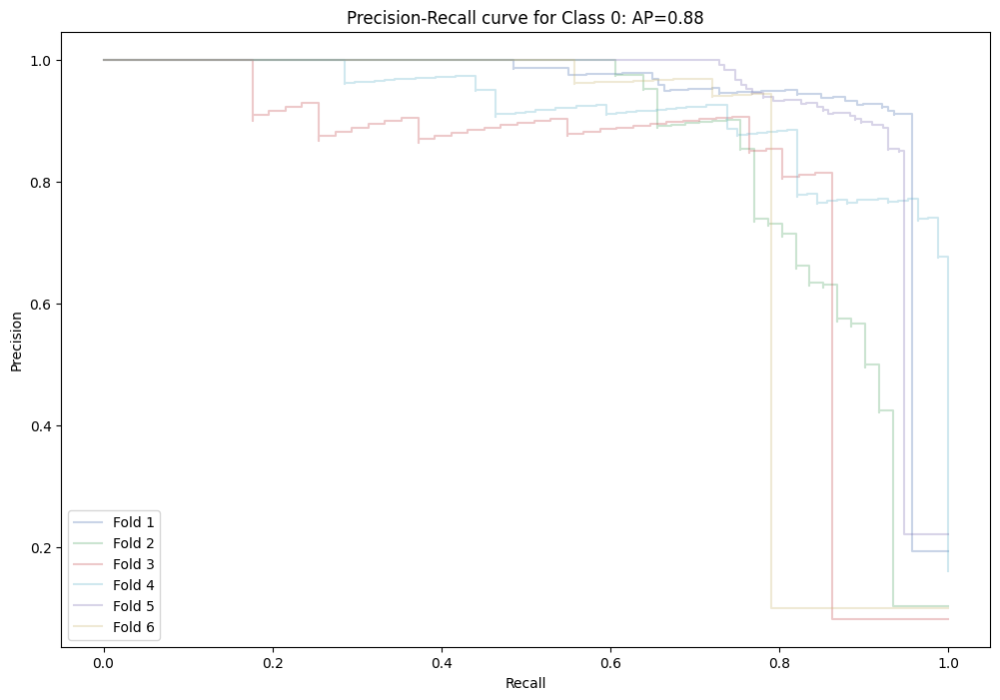

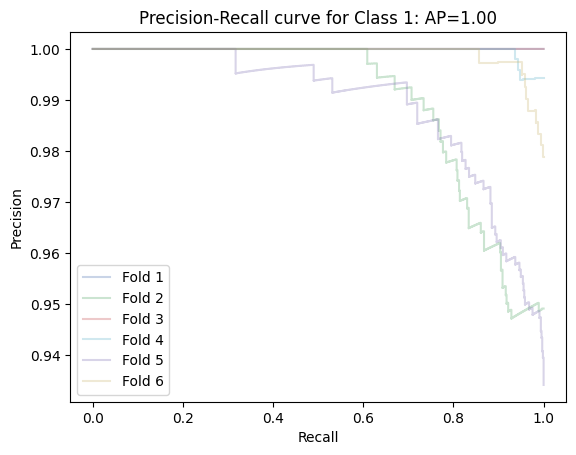

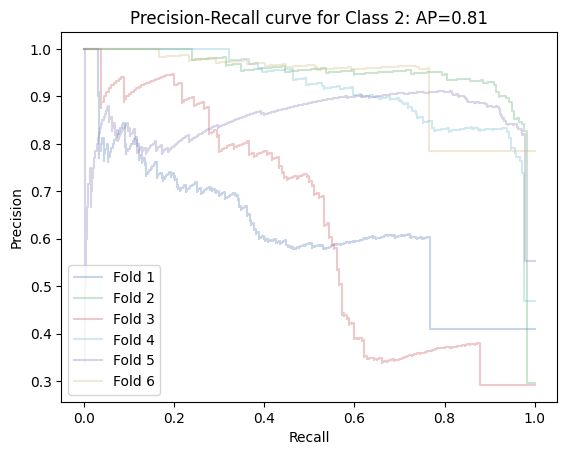

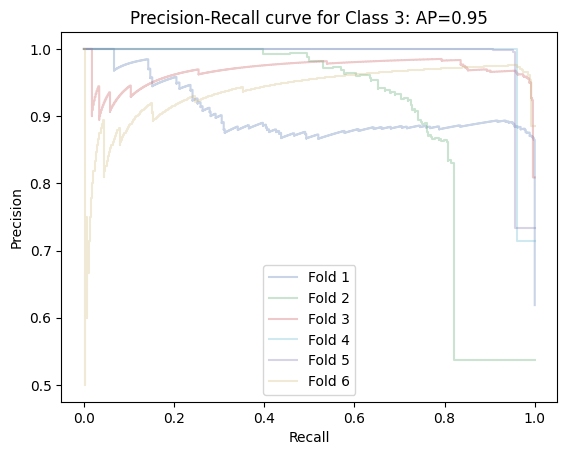

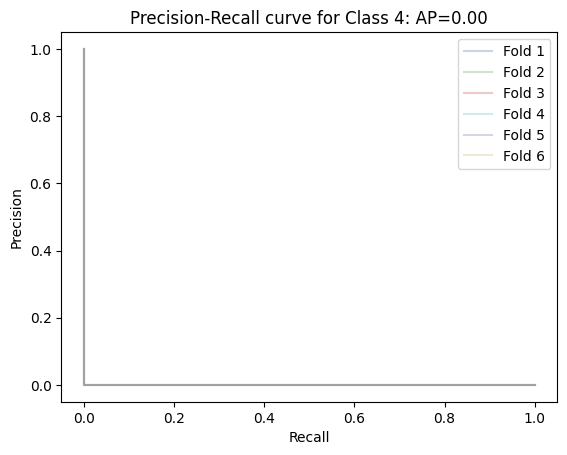

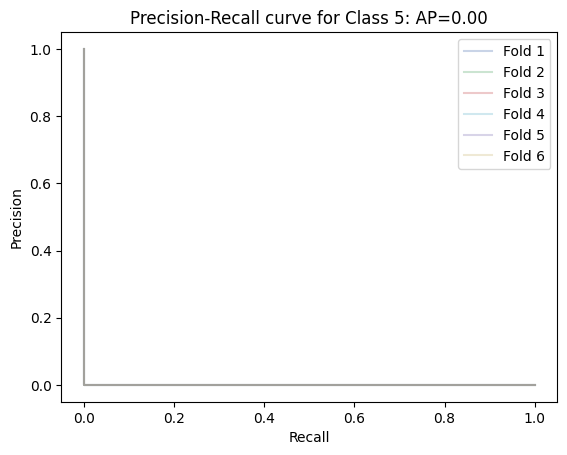

In [ ]:
import os
import re
import shutil
from pathlib import Path
import pandas as pd
import random
from ultralytics import YOLO
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, ConfusionMatrixDisplay
import json
import numpy as np

# Original Dataset Metadata
ultrasound_positions = ['1TCC', '1TCC1', '2TMLI', '3TANI']
subject_names = ['Sub011', 'Sub012', 'Sub013', 'Sub015', 'Sub016', 'Sub017']
num_of_classes = 6

# Output dataset path
dataset_path = '/content/drive/MyDrive/datasets'

# Classes Needs to be dropped
to_drop = [1, 2]

# Helper functions
def delete_files_in_directory(directory_path):
    files = os.listdir(directory_path)
    for file in files:
        file_path = os.path.join(directory_path, file)
        if os.path.isfile(file_path):
            os.remove(file_path)
    print(f"All files deleted successfully in {directory_path}.")

def train_test_split(data, test_size, seed):
    random.seed(seed)
    random.shuffle(data)
    split_idx = int(test_size * len(data))
    return data[split_idx:], data[:split_idx]

def preprocess_data(subject_names, ultrasound_positions, dataset_path, to_drop):
    filenames = []
    total_empty_count = 0
    total_file_count = 0

    for subject in subject_names:
        for position in ultrasound_positions:
            empty_count = 0
            bounding_box_filenames = []
            mypath = Path(f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/")
            pattern = r".*\.txt$"

            for filename in os.listdir(mypath):
                if re.search(pattern, filename):
                    bounding_box_filenames.append(filename)
            total_file_count += len(bounding_box_filenames)
            for filename in bounding_box_filenames:
                with open(mypath / filename, 'r') as file_obj:
                    first_char = file_obj.read(1)
                    if not first_char:
                        empty_count += 1
                    else:
                        filenames.append(f"{subject}_{position}_{str(filename[:-4])}")

            if empty_count > 0:
                total_empty_count += empty_count

    print(f"Total {total_empty_count} empty annotations found out of {total_file_count} files")
    return filenames

def create_fold_datasets(filenames, test_subject, dataset_path):
    train_filenames = []
    val_filenames = []

    for subject in test_subject:
        for position in ultrasound_positions:
            mypath = Path(f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/")
            pattern = r".*\.txt$"
            for filename in os.listdir(mypath):
                if re.search(pattern, filename):
                    new_filename = f"{subject}_{position}_{str(filename[:-4])}"
                    if new_filename in filenames:
                        val_filenames.append(new_filename)
                        filenames.remove(new_filename)

    train_filenames, _ = train_test_split(filenames, test_size=0.1, seed=44)
    return train_filenames, val_filenames

def save_fold_data(train_filenames, val_filenames, test_filenames, dataset_path):
    # Create directories if not exist
    for split in ['train', 'val', 'test']:
        for subdir in ['images', 'labels']:
            os.makedirs(os.path.join(dataset_path, split, subdir), exist_ok=True)

    # Clear existing data
    for split in ['train', 'val', 'test']:
        for subdir in ['images', 'labels']:
            delete_files_in_directory(os.path.join(dataset_path, split, subdir))

    # Helper function to parse filename
    def parse_filename(filename):
        parts = filename.split('_')
        subject = parts[0]
        position = parts[1]
        fname = '_'.join(parts[2:])
        return subject, position, fname

    # Save train data
    for filename in train_filenames:
        subject, position, fname = parse_filename(filename)
        src_image = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.png"
        src_label = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.txt"
        dst_image = f"{dataset_path}/train/images/{filename}.png"
        dst_label = f"{dataset_path}/train/labels/{filename}.txt"
        shutil.copy(src_image, dst_image)
        shutil.copy(src_label, dst_label)

    # Save val data
    for filename in val_filenames:
        subject, position, fname = parse_filename(filename)
        src_image = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.png"
        src_label = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.txt"
        dst_image = f"{dataset_path}/val/images/{filename}.png"
        dst_label = f"{dataset_path}/val/labels/{filename}.txt"
        shutil.copy(src_image, dst_image)
        shutil.copy(src_label, dst_label)

    # Save test data
    for filename in test_filenames:
        subject, position, fname = parse_filename(filename)
        src_image = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.png"
        src_label = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.txt"
        dst_image = f"{dataset_path}/test/images/{filename}.png"
        dst_label = f"{dataset_path}/test/labels/{filename}.txt"
        shutil.copy(src_image, dst_image)
        shutil.copy(src_label, dst_label)

def preprocess_labels(dataset_path, to_drop, num_of_classes):
    folders = ['train', 'val', 'test']
    sub_folders = ['labels']

    to_drop.sort()
    j = 0
    value_map = {}
    for i in range(num_of_classes-1, 0, -1):
        if j == len(to_drop):
            break
        if i not in to_drop and to_drop[j] < i:
            value_map[i] = to_drop[j]
            j += 1

    for folder in folders:
        for sub_folder in sub_folders:
            mypath = Path(f"{dataset_path}/{folder}/{sub_folder}/")
            for filename in os.listdir(mypath):
                df_file = pd.read_csv(mypath / filename, delimiter=" ", names=['class', 'x', 'y', 'w', 'h'])
                df_file.loc[df_file['w'] > 1, 'w'] = 1.0
                df_file.loc[df_file['w'] < 0, 'w'] = 0.0
                df_file.loc[df_file['h'] > 1, 'h'] = 1.0
                df_file.loc[df_file['h'] < 0, 'h'] = 0.0
                df_file = df_file[~df_file['class'].isin(to_drop)]
                df_file = df_file[df_file['class'] < num_of_classes]
                for key, value in value_map.items():
                    df_file.loc[df_file['class'] == key, 'class'] = value
                df_file.to_csv(mypath / filename, index=False, header=False, sep=" ")

def extract_test_labels(dataset_path, output_dir):
    real_labels = []
    test_labels_dir = Path(f"{dataset_path}/test/labels/")
    for label_file in os.listdir(test_labels_dir):
        file_path = test_labels_dir / label_file
        labels = []
        with open(file_path, 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                if class_id < num_of_classes:
                    labels.append(class_id)
        real_labels.append({
            'file': label_file[:-4],
            'labels': labels
        })
    os.makedirs(output_dir, exist_ok=True)
    with open(os.path.join(output_dir, 'real_labels.json'), 'w') as f:
        json.dump(real_labels, f, indent=4)

def extract_test_predictions(model, dataset_path, output_dir):
    pred_labels = []
    test_images_dir = Path(f"{dataset_path}/test/images/")
    for img_file in os.listdir(test_images_dir):
        img_path = test_images_dir / img_file
        results = model(img_path)
        for r in results:
            for box in r.boxes:
                if box.cls < num_of_classes:
                    pred_labels.append({
                        'image_id': img_file[:-4],
                        'category_id': int(box.cls),
                        'bbox': box.xywh.tolist(),
                        'score': float(box.conf)
                    })
    os.makedirs(output_dir, exist_ok=True)
    with open(os.path.join(output_dir, 'best_predictions.json'), 'w') as f:
        json.dump(pred_labels, f, indent=4)

def prepare_data(real_labels_data, predictions_data, num_of_classes):
    y_true = [[] for _ in range(num_of_classes)]
    y_scores = [[] for _ in range(num_of_classes)]
    real_labels_dict = {item['file']: item['labels'] for item in real_labels_data}
    predictions_dict = {}
    for item in predictions_data:
        if item['image_id'] not in predictions_dict:
            predictions_dict[item['image_id']] = []
        predictions_dict[item['image_id']].append((item['category_id'], item['score']))

    for file, real_labels in real_labels_dict.items():
        if file in predictions_dict:
            predictions = predictions_dict[file]
            for class_id in range(num_of_classes):
                y_true[class_id].append(1 if class_id in real_labels else 0)
                class_scores = [score for cat_id, score in predictions if cat_id == class_id]
                y_scores[class_id].append(max(class_scores) if class_scores else 0)

    return y_true, y_scores

def save_fold_results(y_true, y_scores, result_dir, experiment_name, test_subject):
    os.makedirs(f"{result_dir}/{experiment_name}_fold_{test_subject}/pr_curves", exist_ok=True)
    results = {
        'y_true': y_true,
        'y_scores': y_scores
    }
    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/pr_curves/results.json", 'w') as f:
        json.dump(results, f)

def save_confusion_matrix(cm, result_dir, experiment_name, test_subject):
    os.makedirs(f"{result_dir}/{experiment_name}_fold_{test_subject}/confusion_matrix", exist_ok=True)
    cm_file = f"{result_dir}/{experiment_name}_fold_{test_subject}/confusion_matrix/confusion_matrix.npy"
    np.save(cm_file, cm)

# Model training config
experiment_name = "v0.0.2.20"
model_name = "yolov9c"
result_dir = "results"
num_epochs = 100
epoch_patience = 20
image_size = 320
optimizer = "auto"
learning_rate = 0.0001
batch_size = 32
pretrained = True
exist_ok = True
resume = True
dropout = 0.1
save_json = True

# 7-fold cross-validation
all_subjects = subject_names.copy()
pr_curves = {i: {'precision': [], 'recall': [], 'average_precision': []} for i in range(num_of_classes)}

for test_subject in all_subjects:
    print(f"Processing fold with test subject: {test_subject}")

    # Prepare filenames
    filenames = preprocess_data(subject_names, ultrasound_positions, dataset_path, to_drop)

    # Create datasets for the current fold
    train_filenames, val_filenames = create_fold_datasets(filenames, [test_subject], dataset_path)
    test_filenames = val_filenames.copy()

    # Save datasets
    save_fold_data(train_filenames, val_filenames, test_filenames, dataset_path)

    # Preprocess labels
    preprocess_labels(dataset_path, to_drop, num_of_classes)

    # Train model
    model = YOLO(f"{model_name}.yaml")
    model.train(
        data=f"{dataset_path}/data.yaml",
        project=result_dir,
        name=f"{experiment_name}_fold_{test_subject}",
        pretrained=pretrained,
        imgsz=image_size,
        epochs=num_epochs,
        patience=epoch_patience,
        optimizer=optimizer,
        lr0=learning_rate,
        batch=batch_size,
        exist_ok=exist_ok,
        resume=resume,
        dropout=dropout
    )

    # Perform validation
    metrics = model.val(
        project=f"{result_dir}/{experiment_name}_fold_{test_subject}",
        split="val",
        name=f"val",
        exist_ok=exist_ok,
        save_crop=True,
    )

    # Extract real labels and predictions
    output_dir = f"{result_dir}/{experiment_name}_fold_{test_subject}/test_labels"
    extract_test_labels(dataset_path, output_dir)
    output_dir = f"{result_dir}/{experiment_name}_fold_{test_subject}/test_predictions"
    extract_test_predictions(model, dataset_path, output_dir)

    # Load real labels and predictions
    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/test_labels/real_labels.json") as f:
        real_labels_data = json.load(f)
    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/test_predictions/best_predictions.json") as f:
        predictions_data = json.load(f)

    # Prepare data
    y_true, y_scores = prepare_data(real_labels_data, predictions_data, num_of_classes)

    # Compute PR curve and average precision for each class
    for class_id in range(num_of_classes):
        if y_true[class_id] and y_scores[class_id]:
            precision, recall, _ = precision_recall_curve(y_true[class_id], y_scores[class_id])
            average_precision = average_precision_score(y_true[class_id], y_scores[class_id])
            pr_curves[class_id]['precision'].append(precision)
            pr_curves[class_id]['recall'].append(recall)
            pr_curves[class_id]['average_precision'].append(average_precision)
        else:
            print(f"No valid data for class {class_id} in fold with test subject {test_subject}")

    # Save fold results
    save_fold_results(y_true, y_scores, result_dir, experiment_name, test_subject)

    # Calculate confusion matrix
    y_true_flat = [item for sublist in y_true for item in sublist]
    y_pred_flat = [1 if score >= 0.5 else 0 for sublist in y_scores for score in sublist]
    cm = confusion_matrix(y_true_flat, y_pred_flat, labels=list(range(num_of_classes)))

    # Save confusion matrix
    save_confusion_matrix(cm, result_dir, experiment_name, test_subject)

# Plot PR curves for each class
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(12, 8))

for class_id in range(num_of_classes):
    for fold_idx in range(len(all_subjects)):
        if fold_idx < len(pr_curves[class_id]['recall']):
            plt.step(pr_curves[class_id]['recall'][fold_idx], pr_curves[class_id]['precision'][fold_idx],
                     where='post', color=colors[fold_idx % len(colors)], alpha=0.3, label=f'Fold {fold_idx + 1}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall curve for Class {class_id}: AP={np.mean(pr_curves[class_id]["average_precision"]):.2f}')
    plt.legend()
    plt.show()


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir results

<IPython.core.display.Javascript object>

#Creating the arrays of y_true and y_scores for each fold

In [ ]:
def save_fold_results(y_true, y_scores, result_dir, experiment_name, test_subject):
    os.makedirs(f"{result_dir}/{experiment_name}_fold_{test_subject}/pr_curves", exist_ok=True)
    results = {
        'y_true': y_true,
        'y_scores': y_scores
    }
    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/pr_curves/results.json", 'w') as f:
        json.dump(results, f)

for test_subject in all_subjects:
    print(f"Processing fold with test subject: {test_subject}")

    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/test_labels/real_labels.json") as f:
        real_labels_data = json.load(f)
    with open(f"{result_dir}/{experiment_name}_fold_{test_subject}/test_predictions/best_predictions.json") as f:
        predictions_data = json.load(f)

    y_true, y_scores = prepare_data(real_labels_data, predictions_data, num_of_classes)

    save_fold_results(y_true, y_scores, result_dir, experiment_name, test_subject)


Processing fold with test subject: Sub011
Processing fold with test subject: Sub012
Processing fold with test subject: Sub013
Processing fold with test subject: Sub015
Processing fold with test subject: Sub016
Processing fold with test subject: Sub017


# Plotting the PR curve

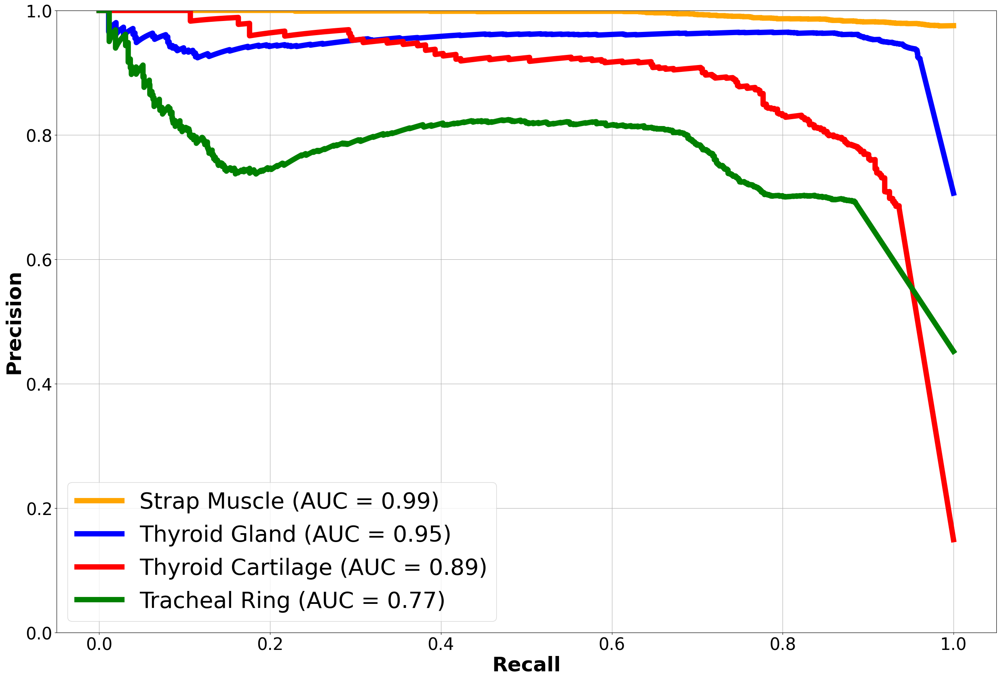

In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

json_files = [
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub011/pr_curves/results.json',
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub012/pr_curves/results.json',
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub013/pr_curves/results.json',
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub015/pr_curves/results.json',
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub016/pr_curves/results.json',
    '/content/drive/MyDrive/yolov9c_results/v0.0.2.20_fold_Sub017/pr_curves/results.json'
]

y_true_all_classes = [[] for _ in range(4)]
y_scores_all_classes = [[] for _ in range(4)]
y_true_combined = []
y_scores_combined = []

for json_file in json_files:
    with open(json_file, 'r') as file:
        data = json.load(file)
    y_true_all = data['y_true']
    y_scores_all = data['y_scores']
    for class_id in range(4):
        y_true_all_classes[class_id].extend(y_true_all[class_id])
        y_scores_all_classes[class_id].extend(y_scores_all[class_id])
        y_true_combined.extend(y_true_all[class_id])
        y_scores_combined.extend(y_scores_all[class_id])

colors = ['red', 'orange', 'green', 'blue']
class_names = ['Thyroid Cartilage', 'Strap Muscle', 'Tracheal Ring', 'Thyroid Gland']

class_aucs = []
for class_id in range(4):
    precision, recall, _ = precision_recall_curve(y_true_all_classes[class_id], y_scores_all_classes[class_id])
    auc_score = auc(recall, precision)
    class_aucs.append((class_names[class_id], auc_score, precision, recall, colors[class_id]))

class_aucs_sorted = sorted(class_aucs, key=lambda x: x[1], reverse=True)

precision_combined, recall_combined, _ = precision_recall_curve(y_true_combined, y_scores_combined)
auc_combined = auc(recall_combined, precision_combined)

plt.figure(figsize=(30, 20))

for class_name, auc_score, precision, recall, color in class_aucs_sorted:
    plt.plot(recall, precision, label=f'{class_name} (AUC = {auc_score:.2f})', color=color, linewidth=9.5)

#plt.plot(recall_combined, precision_combined, label=f'Average (AUC = {auc_combined:.2f})', color='purple', linestyle='--', linewidth=9.5)

plt.xlabel('Recall', fontsize=36, fontweight='bold')
plt.ylabel('Precision', fontsize=36, fontweight='bold')
#plt.title('Precision-Recall Curves for Each Class', fontsize=38, fontweight='bold')
plt.ylim([0, 1])
plt.xlim([-0.05, 1.05])
plt.legend(loc='lower left', fontsize=40)
plt.grid(True)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

#Plotting the confusion matrix across the 4 classes for 7 folds

<Figure size 1200x1000 with 0 Axes>

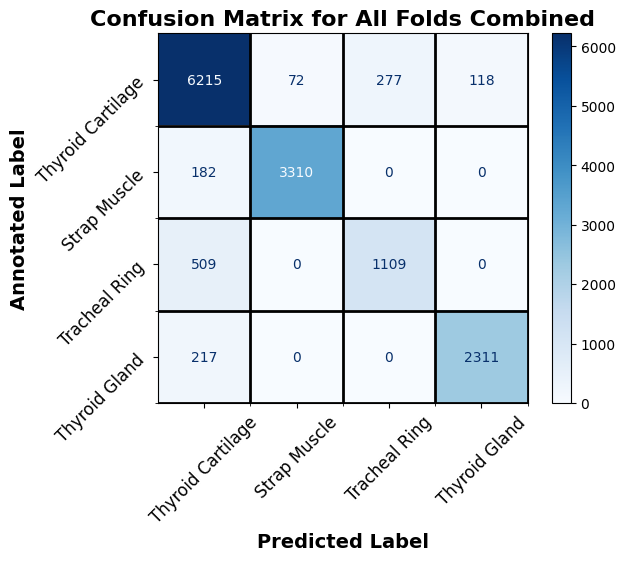

In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

json_files = [
    '/content/yolov9/results/v0.0.2.20_fold_Sub011/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub012/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub013/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub015/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub016/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub017/pr_curves/results.json'
]

y_true_all = []
y_pred_all = []

threshold = 0.5

for json_file in json_files:
    with open(json_file, 'r') as file:
        data = json.load(file)

    y_true_fold = data['y_true']
    y_scores_fold = data['y_scores']

    y_pred_fold = [[1 if score >= threshold else 0 for score in y_scores_fold[class_id]] for class_id in range(4)]

    for class_id in range(4):
        y_true_all.extend([(class_id if label == 1 else 0) for label in y_true_fold[class_id]])
        y_pred_all.extend([(class_id if pred == 1 else 0) for pred in y_pred_fold[class_id]])

class_names = ['Thyroid Cartilage', 'Strap Muscle', 'Tracheal Ring', 'Thyroid Gland']

cm = confusion_matrix(y_true_all, y_pred_all, labels=[0, 1, 2, 3])

plt.figure(figsize=(12, 10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title('Confusion Matrix for All Folds Combined', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.ylabel('Annotated Label', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=45)
plt.gca().set_xticks([x + 0.5 for x in range(len(class_names))], minor=True)
plt.gca().set_yticks([y + 0.5 for y in range(len(class_names))], minor=True)
plt.grid(which='minor', color='black', linestyle='-', linewidth=2)
plt.show()

#Plotting the normalized confusion matrix across the 4 classes for 7 folds

<Figure size 1200x1000 with 0 Axes>

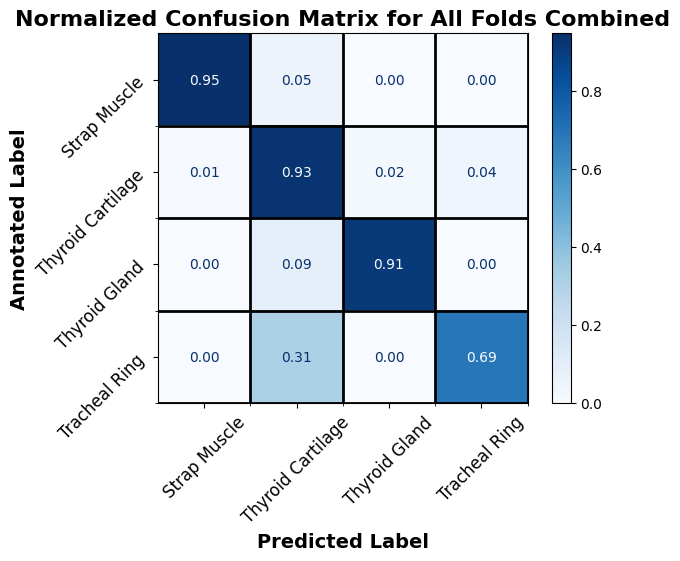

In [ ]:
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

json_files = [
    '/content/yolov9/results/v0.0.2.20_fold_Sub011/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub012/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub013/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub015/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub016/pr_curves/results.json',
    '/content/yolov9/results/v0.0.2.20_fold_Sub017/pr_curves/results.json'
]

y_true_all = []
y_pred_all = []

threshold = 0.5

for json_file in json_files:
    with open(json_file, 'r') as file:
        data = json.load(file)

    y_true_fold = data['y_true']
    y_scores_fold = data['y_scores']

    y_pred_fold = [[1 if score >= threshold else 0 for score in y_scores_fold[class_id]] for class_id in range(4)]

    for class_id in range(4):
        y_true_all.extend([(class_id if label == 1 else 0) for label in y_true_fold[class_id]])
        y_pred_all.extend([(class_id if pred == 1 else 0) for pred in y_pred_fold[class_id]])

# Original class order
original_class_names = ['Thyroid Cartilage', 'Strap Muscle', 'Tracheal Ring', 'Thyroid Gland']
# New class order (high to low accuracy)
ordered_class_names = ['Strap Muscle', 'Thyroid Cartilage', 'Thyroid Gland', 'Tracheal Ring']

# Mapping from original to new order
class_mapping = {original_class_names.index(class_name): ordered_class_names.index(class_name) for class_name in ordered_class_names}

# Reorder y_true and y_pred based on new order
y_true_ordered = [class_mapping[orig] for orig in y_true_all]
y_pred_ordered = [class_mapping[orig] for orig in y_pred_all]

cm = confusion_matrix(y_true_ordered, y_pred_ordered, labels=[0, 1, 2, 3], normalize='true')

plt.figure(figsize=(12, 10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=ordered_class_names)
disp.plot(cmap=plt.cm.Blues, values_format='.2f')
plt.title('Normalized Confusion Matrix for All Folds Combined', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.ylabel('Annotated Label', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=45)
plt.gca().set_xticks([x + 0.5 for x in range(len(ordered_class_names))], minor=True)
plt.gca().set_yticks([y + 0.5 for y in range(len(ordered_class_names))], minor=True)
plt.grid(which='minor', color='black', linestyle='-', linewidth=2)
plt.show()


# Calculating F1 score and mAP

In [ ]:
import pandas as pd

csv_files = [
    '/content/yolov9/results/v0.0.2.20_fold_Sub011/results.csv',
    '/content/yolov9/results/v0.0.2.20_fold_Sub012/results.csv',
    '/content/yolov9/results/v0.0.2.20_fold_Sub013/results.csv',
    '/content/yolov9/results/v0.0.2.20_fold_Sub015/results.csv',
    '/content/yolov9/results/v0.0.2.20_fold_Sub016/results.csv',
    '/content/yolov9/results/v0.0.2.20_fold_Sub017/results.csv'
]
precision_col = 'metrics/precision(B)'
recall_col = 'metrics/recall(B)'
map50_col = 'metrics/mAP50(B)'
map50_95_col = 'metrics/mAP50-95(B)'
f1_list = []
map50_list = []
map50_95_list = []

for csv_file in csv_files:

    df = pd.read_csv(csv_file)
    df.columns = df.columns.str.strip()
    precision = df[precision_col].iloc[-1]
    recall = df[recall_col].iloc[-1]
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    map50 = df[map50_col].iloc[-1]
    map50_95 = df[map50_95_col].iloc[-1]
    f1_list.append(f1)
    map50_list.append(map50)
    map50_95_list.append(map50_95)

avg_f1 = sum(f1_list) / len(f1_list)
avg_map50 = sum(map50_list) / len(map50_list)
avg_map50_95 = sum(map50_95_list) / len(map50_95_list)

print(f"Average F1 Score: {avg_f1:.4f}")
print(f"Average mAP50: {avg_map50:.4f}")
print(f"Average mAP50-95: {avg_map50_95:.4f}")

Average F1 Score: 0.8262
Average mAP50: 0.8420
Average mAP50-95: 0.4671


# Inference

In [ ]:
!python /content/yolov9/detect.py --data '/content/drive/MyDrive/datasets/data.yaml' --source '/content/drive/MyDrive/test7/images' --img 320 --device 0 --weights '/content/yolov9/results/v0.0.2.20_fold_Sub017/weights/best.pt'

detect: weights=['/content/yolov9/results/v0.0.2.20_fold_Sub017/weights/best.pt'], source=/content/drive/MyDrive/test7/images, data=/content/drive/MyDrive/datasets/data.yaml, imgsz=[320, 320], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

YOLOv9e summary (fused): 687 layers, 57379484 parameters, 0 gradients, 189.1 GFLOPs
image 1/426 /content/drive/MyDrive/test7/images/Sub017_1TCC1_F000054_frame000.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland, 41.9ms
image 2/426 /content/drive/MyDrive/test7/images/Sub017_1TCC1_F000054_frame001.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland,

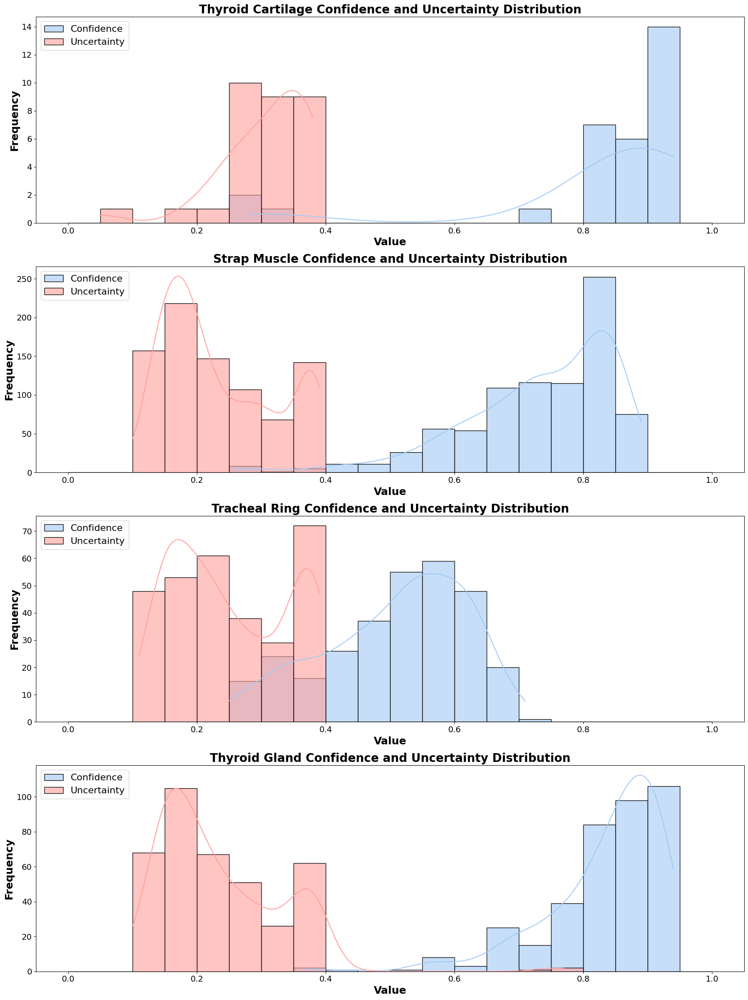

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import numpy as np

uncertainty_files_dir = '/content/yolov9/runs/detect/exp3'
uncertainty_files = glob.glob(os.path.join(uncertainty_files_dir, '*_uncertainties.txt'))

def extract_confidences_and_uncertainties(file_path):
    confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    class_map = {
        'Thyroid-cartilage': 'Thyroid Cartilage',
        'Strap-muscle': 'Strap Muscle',
        'Tracheal-ring': 'Tracheal Ring',
        'Thyroid-gland': 'Thyroid Gland'
    }
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            for original_class, mapped_class in class_map.items():
                if original_class in line:
                    confidence_value = float(line.split('Confidence ')[1].split(',')[0])
                    uncertainty_value = float(line.split('Uncertainty ')[1])
                    confidences[mapped_class].append(confidence_value)
                    uncertainties[mapped_class].append(uncertainty_value)
    return confidences, uncertainties

all_confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
all_uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}

for file_path in uncertainty_files:
    confidences, uncertainties = extract_confidences_and_uncertainties(file_path)
    for key in all_confidences:
        all_confidences[key].extend(confidences[key])
        all_uncertainties[key].extend(uncertainties[key])

plt.figure(figsize=(18, 24))
palette = sns.color_palette("pastel")

for i, key in enumerate(all_confidences.keys()):
    plt.subplot(4, 1, i + 1)
    bins = np.linspace(0, 1, 21)  # Standard bin edges from 0 to 1 with 20 bins
    sns.histplot(all_confidences[key], bins=bins, kde=True, color=palette[0], label='Confidence', alpha=0.6)
    sns.histplot(all_uncertainties[key], bins=bins, kde=True, color=palette[3], label='Uncertainty', alpha=0.6)
    plt.title(f'{key} Confidence and Uncertainty Distribution', fontsize=20, fontweight='bold')
    plt.xlabel('Value', fontsize=18, fontweight='bold')
    plt.ylabel('Frequency', fontsize=18, fontweight='bold')
    plt.legend(loc='upper left', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

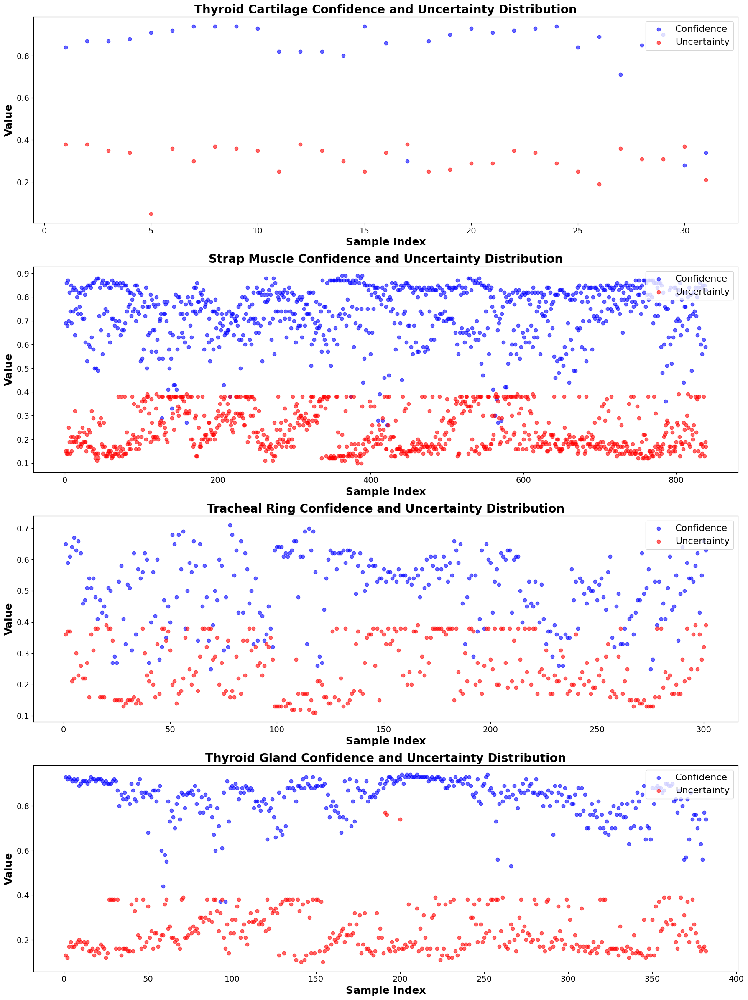

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import numpy as np

uncertainty_files_dir = '/content/drive/MyDrive/fold7/yolov9/runs/detect/exp3'
uncertainty_files = glob.glob(os.path.join(uncertainty_files_dir, '*_uncertainties.txt'))

def extract_confidences_and_uncertainties(file_path):
    confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    class_map = {
        'Thyroid-cartilage': 'Thyroid Cartilage',
        'Strap-muscle': 'Strap Muscle',
        'Tracheal-ring': 'Tracheal Ring',
        'Thyroid-gland': 'Thyroid Gland'
    }
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            for original_class, mapped_class in class_map.items():
                if original_class in line:
                    confidence_value = float(line.split('Confidence ')[1].split(',')[0])
                    uncertainty_value = float(line.split('Uncertainty ')[1])
                    confidences[mapped_class].append(confidence_value)
                    uncertainties[mapped_class].append(uncertainty_value)
    return confidences, uncertainties

all_confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
all_uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}

for file_path in uncertainty_files:
    confidences, uncertainties = extract_confidences_and_uncertainties(file_path)
    for key in all_confidences:
        all_confidences[key].extend(confidences[key])
        all_uncertainties[key].extend(uncertainties[key])

plt.figure(figsize=(18, 24))
colors = {'Confidence': 'blue', 'Uncertainty': 'red'}

for i, key in enumerate(all_confidences.keys()):
    plt.subplot(4, 1, i + 1)
    indices = range(1, len(all_confidences[key]) + 1)
    plt.scatter(indices, all_confidences[key], color=colors['Confidence'], label='Confidence', alpha=0.6)
    plt.scatter(indices, all_uncertainties[key], color=colors['Uncertainty'], label='Uncertainty', alpha=0.6)
    plt.title(f'{key} Confidence and Uncertainty Distribution', fontsize=20, fontweight='bold')
    plt.xlabel('Sample Index', fontsize=18, fontweight='bold')
    plt.ylabel('Value', fontsize=18, fontweight='bold')
    plt.legend(loc='upper right', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

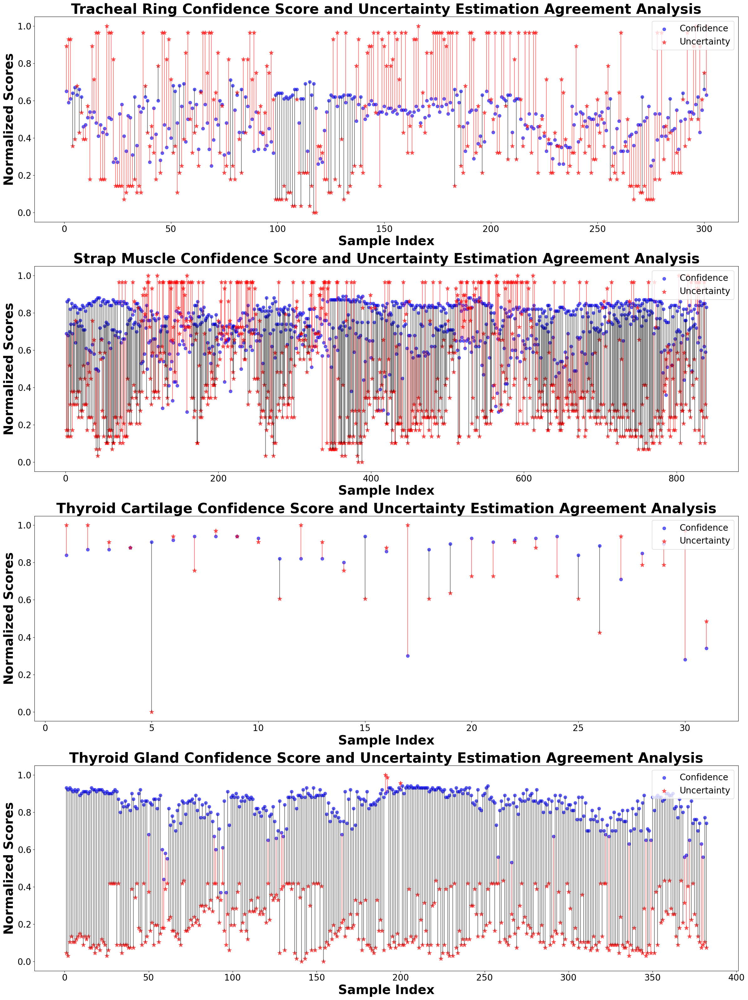

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import numpy as np

uncertainty_files_dir = '/content/drive/MyDrive/fold7/yolov9/runs/detect/exp3/results'
uncertainty_files = glob.glob(os.path.join(uncertainty_files_dir, '*_uncertainties.txt'))

def extract_confidences_and_uncertainties(file_path):
    confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    class_map = {
        'Thyroid-cartilage': 'Thyroid Cartilage',
        'Strap-muscle': 'Strap Muscle',
        'Tracheal-ring': 'Tracheal Ring',
        'Thyroid-gland': 'Thyroid Gland'
    }
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            for original_class, mapped_class in class_map.items():
                if original_class in line:
                    confidence_value = float(line.split('Confidence ')[1].split(',')[0])
                    uncertainty_value = float(line.split('Uncertainty ')[1])
                    confidences[mapped_class].append(confidence_value)
                    uncertainties[mapped_class].append(uncertainty_value)
    return confidences, uncertainties

def normalize_values(values):
    min_val = min(values)
    max_val = max(values)
    return [(val - min_val) / (max_val - min_val) for val in values]

all_confidences = {'Tracheal Ring': [], 'Strap Muscle': [], 'Thyroid Cartilage': [], 'Thyroid Gland': []}
all_uncertainties = {'Tracheal Ring': [], 'Strap Muscle': [], 'Thyroid Cartilage': [], 'Thyroid Gland': []}

for file_path in uncertainty_files:
    confidences, uncertainties = extract_confidences_and_uncertainties(file_path)
    for key in all_confidences:
        all_confidences[key].extend(confidences[key])
        all_uncertainties[key].extend(uncertainties[key])

# Normalize only the uncertainty values
for key in all_uncertainties:
    all_uncertainties[key] = normalize_values(all_uncertainties[key])

plt.figure(figsize=(24, 32))
colors = {'Confidence': 'blue', 'Uncertainty': 'red'}

for i, key in enumerate(all_confidences.keys()):
    plt.subplot(4, 1, i + 1)
    indices = range(1, len(all_confidences[key]) + 1)
    plt.scatter(indices, all_confidences[key], color=colors['Confidence'], label='Confidence', alpha=0.6, s=50)
    plt.scatter(indices, all_uncertainties[key], color=colors['Uncertainty'], label='Uncertainty', alpha=0.6, marker='*', s=100)
    for j in indices:
        if key == 'Tracheal Ring':
            if all_confidences[key][j-1] >= 0.6 and all_uncertainties[key][j-1] <= 0.8:
                plt.plot([j, j], [all_confidences[key][j-1], all_uncertainties[key][j-1]], color='black', alpha=0.5)
            else:
                plt.plot([j, j], [all_confidences[key][j-1], all_uncertainties[key][j-1]], color='red', alpha=0.5)
        else:
            if all_confidences[key][j-1] >= 0.7 and all_uncertainties[key][j-1] <= 0.7:
                plt.plot([j, j], [all_confidences[key][j-1], all_uncertainties[key][j-1]], color='black', alpha=0.5)
            else:
                plt.plot([j, j], [all_confidences[key][j-1], all_uncertainties[key][j-1]], color='red', alpha=0.5)
    plt.title(f'{key} Confidence Score and Uncertainty Estimation Agreement Analysis', fontsize=32, fontweight='bold')
    plt.xlabel('Sample Index', fontsize=29, fontweight='bold')
    plt.ylabel('Normalized Scores', fontsize=29, fontweight='bold')
    plt.legend(loc='upper right', fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

#finding images with high certainty and high uncertainty scores

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import numpy as np
import cv2

uncertainty_files_dir = '/content/drive/MyDrive/fold5/yolov9/runs/detect/exp2'
uncertainty_files = glob.glob(os.path.join(uncertainty_files_dir, '*_uncertainties.txt'))
image_dir = '/content/drive/MyDrive/fold5/yolov9/runs/detect/exp2'
results_dir = '/content/drive/MyDrive/fold5/yolov9/runs/detect/High_cert_high_uncert'

if not os.path.exists(results_dir):
    os.makedirs(results_dir)

def extract_confidences_and_uncertainties(file_path):
    confidences = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    uncertainties = {'Thyroid Cartilage': [], 'Strap Muscle': [], 'Tracheal Ring': [], 'Thyroid Gland': []}
    class_map = {
        'Thyroid-cartilage': 'Thyroid Cartilage',
        'Strap-muscle': 'Strap Muscle',
        'Tracheal-ring': 'Tracheal Ring',
        'Thyroid-gland': 'Thyroid Gland'
    }
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            for original_class, mapped_class in class_map.items():
                if original_class in line:
                    confidence_value = float(line.split('Confidence ')[1].split(',')[0])
                    uncertainty_value = float(line.split('Uncertainty ')[1])
                    confidences[mapped_class].append(confidence_value)
                    uncertainties[mapped_class].append(uncertainty_value)
    return confidences, uncertainties

def find_high_confidence_high_uncertainty_examples():
    high_conf_high_uncertainty_examples = []

    for file_path in uncertainty_files:
        confidences, uncertainties = extract_confidences_and_uncertainties(file_path)
        for key in confidences.keys():
            for conf, unc in zip(confidences[key], uncertainties[key]):
                if conf > 0.7 and unc > 0.35:
                    high_conf_high_uncertainty_examples.append((file_path, key, conf, unc))
    return high_conf_high_uncertainty_examples

examples = find_high_confidence_high_uncertainty_examples()

def display_and_save_example_images(examples):
    for example in examples:
        file_path, key, conf, unc = example
        image_path = file_path.replace('_uncertainties.txt', '.png')
        if os.path.exists(image_path):
            image = cv2.imread(image_path)
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title(f'Class: {key}, Confidence: {conf}, Uncertainty: {unc}', fontsize=16, fontweight='bold')
            plt.axis('off')
            result_image_path = os.path.join(results_dir, os.path.basename(image_path))
            plt.savefig(result_image_path)
            plt.close()
        else:
            print(f"Image file not found for {file_path}")

display_and_save_example_images(examples)


In [ ]:
!python run_detection.py

Streaming output truncated to the last 5000 lines.
image 2179/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame099.png: 320x320 2 Strap-muscles, 1 Thyroid-gland, 21.6ms
image 2180/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame100.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland, 21.6ms
image 2181/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame101.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland, 21.6ms
image 2182/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame102.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland, 21.6ms
image 2183/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame103.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 1 Thyroid-gland, 21.6ms
image 2184/3582 /content/drive/MyDrive/processed_dataset1/images/Sub015_1TCC_F000007_frame104.png: 320x320 2 Strap-muscles, 1 Tracheal-ring, 

In [ ]:
!python plots.py --uncertainty-files-dir /content/drive/MyDrive/fold7/yolov9/runs/detect/exp3/results --save-dir /content/drive/MyDrive/detection_DIR --plot-type conf_uncertainty


python3: can't open file '/content/yolov9/plots.py': [Errno 2] No such file or directory


In [ ]:
import os
import re
import shutil
from pathlib import Path
import pandas as pd
import random
from ultralytics import YOLO
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, ConfusionMatrixDisplay
import json
import numpy as np

# Original Dataset Metadata
ultrasound_positions = ['1TCC', '1TCC1', '2TMLI', '3TANI']
subject_names = ['Sub011', 'Sub012', 'Sub013', 'Sub015', 'Sub016', 'Sub017']
num_of_classes = 6

# Output dataset path
dataset_path = '/content/drive/MyDrive/datasets'
output_path = '/content/drive/MyDrive/processed_dataset'

# Classes Needs to be dropped
to_drop = [1, 2]

def preprocess_data(subject_names, ultrasound_positions, dataset_path, to_drop):
    filenames = []
    total_empty_count = 0
    total_file_count = 0

    for subject in subject_names:
        for position in ultrasound_positions:
            empty_count = 0
            bounding_box_filenames = []
            mypath = Path(f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/")
            if not mypath.exists():
                print(f"Directory {mypath} does not exist.")
                continue

            pattern = r".*\.txt$"

            for filename in os.listdir(mypath):
                if re.search(pattern, filename):
                    bounding_box_filenames.append(filename)
            total_file_count += len(bounding_box_filenames)
            for filename in bounding_box_filenames:
                with open(mypath / filename, 'r') as file_obj:
                    first_char = file_obj.read(1)
                    if not first_char:
                        empty_count += 1
                        os.remove(mypath / filename)
                    else:
                        filenames.append(f"{subject}_{position}_{str(filename[:-4])}")

            if empty_count > 0:
                total_empty_count += empty_count

    print(f"Total {total_empty_count} empty annotations found out of {total_file_count} files")
    return filenames

def save_data(filenames, dataset_path, output_path):
    # Create directories if not exist
    for subdir in ['images', 'labels']:
        os.makedirs(os.path.join(output_path, subdir), exist_ok=True)

    # Helper function to parse filename
    def parse_filename(filename):
        parts = filename.split('_')
        subject = parts[0]
        position = parts[1]
        fname = '_'.join(parts[2:])
        return subject, position, fname

    # Save data
    valid_image_count = 0
    for filename in filenames:
        subject, position, fname = parse_filename(filename)
        src_image = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.png"
        src_label = f"{dataset_path}/Dataset/{subject}/Trachea/{position}/Reviewed/{fname}.txt"
        dst_image = f"{output_path}/images/{filename}.png"
        dst_label = f"{output_path}/labels/{filename}.txt"
        if os.path.exists(src_image) and os.path.exists(src_label):
            shutil.copy(src_image, dst_image)
            shutil.copy(src_label, dst_label)
            valid_image_count += 1

    print(f"Total valid images and annotations: {valid_image_count}")

def preprocess_labels(output_path, to_drop, num_of_classes):
    folders = ['labels']

    to_drop.sort()
    j = 0
    value_map = {}
    for i in range(num_of_classes-1, 0, -1):
        if j == len(to_drop):
            break
        if i not in to_drop and to_drop[j] < i:
            value_map[i] = to_drop[j]
            j += 1

    for folder in folders:
        mypath = Path(f"{output_path}/{folder}/")
        for filename in os.listdir(mypath):
            df_file = pd.read_csv(mypath / filename, delimiter=" ", names=['class', 'x', 'y', 'w', 'h'])
            df_file.loc[df_file['w'] > 1, 'w'] = 1.0
            df_file.loc[df_file['w'] < 0, 'w'] = 0.0
            df_file.loc[df_file['h'] > 1, 'h'] = 1.0
            df_file.loc[df_file['h'] < 0, 'h'] = 0.0
            df_file = df_file[~df_file['class'].isin(to_drop)]
            df_file = df_file[df_file['class'] < num_of_classes]
            for key, value in value_map.items():
                df_file.loc[df_file['class'] == key, 'class'] = value
            df_file.to_csv(mypath / filename, index=False, header=False, sep=" ")

def extract_test_labels(output_path):
    real_labels = []
    test_labels_dir = Path(f"{output_path}/labels/")
    for label_file in os.listdir(test_labels_dir):
        file_path = test_labels_dir / label_file
        labels = []
        with open(file_path, 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                if class_id < num_of_classes:
                    labels.append(class_id)
        real_labels.append({
            'file': label_file[:-4],
            'labels': labels
        })
    with open(os.path.join(output_path, 'real_labels.json'), 'w') as f:
        json.dump(real_labels, f, indent=4)

def extract_test_predictions(model, output_path):
    pred_labels = []
    test_images_dir = Path(f"{output_path}/images/")
    for img_file in os.listdir(test_images_dir):
        img_path = test_images_dir / img_file
        results = model(img_path)
        for r in results:
            for box in r.boxes:
                if box.cls < num_of_classes:
                    pred_labels.append({
                        'image_id': img_file[:-4],
                        'category_id': int(box.cls),
                        'bbox': box.xywh.tolist(),
                        'score': float(box.conf)
                    })
    with open(os.path.join(output_path, 'best_predictions.json'), 'w') as f:
        json.dump(pred_labels, f, indent=4)

# Process the data
filenames = preprocess_data(subject_names, ultrasound_positions, dataset_path, to_drop)
save_data(filenames, dataset_path, output_path)
preprocess_labels(output_path, to_drop, num_of_classes)


Directory /content/drive/MyDrive/datasets/Dataset/Sub011/Trachea/1TCC/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub011/Trachea/1TCC1/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub011/Trachea/2TMLI/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub011/Trachea/3TANI/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub012/Trachea/1TCC/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub012/Trachea/1TCC1/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub012/Trachea/2TMLI/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub012/Trachea/3TANI/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub013/Trachea/1TCC/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/Dataset/Sub013/Trachea/1TCC1/Reviewed does not exist.
Directory /content/drive/MyDrive/datasets/D